In [1]:
import os
import json
import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.models as models
import numpy as np
import cv2
import utils
import trainer
import evaluator
import data_process
import motion_blur
import matplotlib.pyplot as plt

# Set random seed for reproducibility
seed = 211
np.random.seed(seed)
torch.manual_seed(seed)

In [2]:
data_process.download_data()

input_size = 448

transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((input_size, input_size)),
    torchvision.transforms.ToTensor(), # uint8 values in [0, 255] -> float tensor with values [0, 1]
    torchvision.transforms.Normalize(mean=data_process.train_mean.tolist(), std=data_process.train_std.tolist())
])

train_set, val_set, test_set = data_process.load_data(transform=transform, input_size=input_size)

test_set_uni_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.01})
test_set_uni_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.05})
test_set_uni_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.1})
test_set_elli_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.01})
test_set_elli_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.05})
test_set_elli_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.1})
test_set_nat = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'natural'})

Data already exists

Number of valid images: 664
Train set size: 464 - 69.88%
Validation set size: 67 - 10.09%
Test set size: 133 - 20.03%



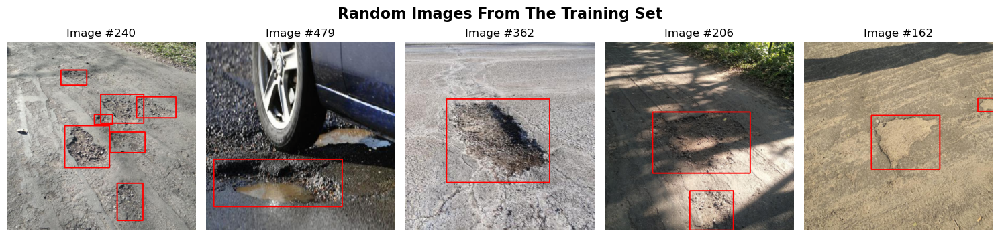

In [4]:
# Display 5 random images from the training set
train_loader = DataLoader(train_set, batch_size=5, shuffle=True, collate_fn=data_process.collate_fn)
images, targets = next(iter(train_loader))
data_process.show_images(images, targets, title="Random Images From The Training Set")

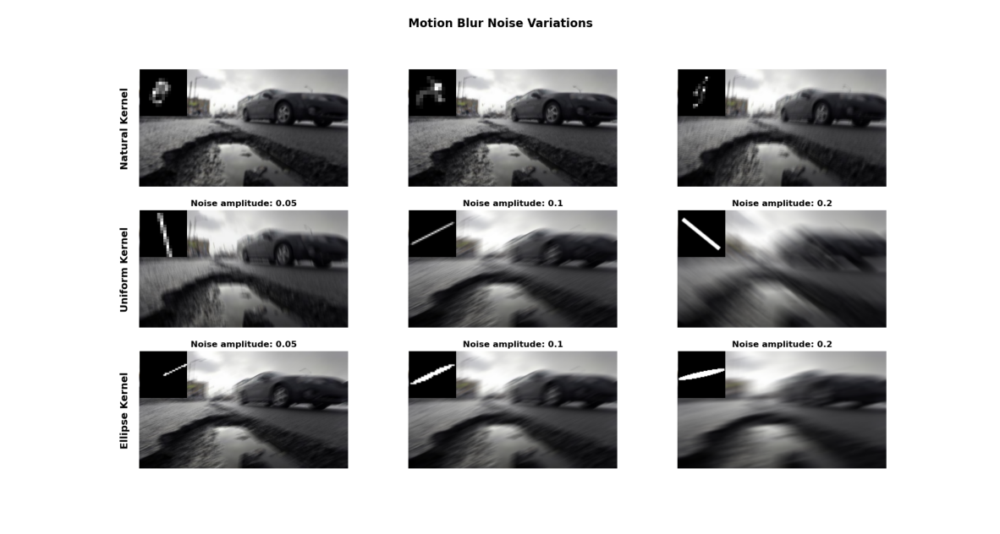

In [5]:
#show noise types
image = cv2.imread("data/motion_blur_data/motion_blur_types.png")
# Convert BGR to RGB for matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display using matplotlib
plt.figure(figsize=(15, 15))
plt.imshow(image_rgb)
plt.axis('off')  # Turn off axis
plt.title("", fontsize=16)
plt.show()

In [8]:
# Train with data augmentation:
history = trainer.train_from_config(model_config_path="data/models/fasterrcnn_mobilenet_v3_large_fpn/fasterrcnn_mobilenet_v3_large_fpn_best_params.json", train_set=train_set, val_set=val_set, save_path="data/models/fasterrcnn_mobilenet_v3_large_fpn", kornia_aug=False)

Starting training for fasterrcnn_mobilenet_v3_large_fpn with the following parameters:
{'batch_size': 6, 'epochs': 17, 'preweight_mode': 'fine_tuning', 'optimizer': 'SGD', 'lr': 0.005562807003835387, 'momentum': 0.9328567236871179, 'weight_decay': 7.349985786517183e-05, 'scheduler': 'ReduceLROnPlateau', 'factor': 0.3997437126341112, 'patience': 4}
Epoch 1/17, Train Loss: 47.1935, Val mAP@50: 0.4074, FPS: 160.79, Epoch Time: 7.44 seconds
Epoch 2/17, Train Loss: 34.5266, Val mAP@50: 0.5252, FPS: 198.82, Epoch Time: 7.07 seconds
Epoch 3/17, Train Loss: 32.7856, Val mAP@50: 0.6020, FPS: 197.52, Epoch Time: 7.01 seconds
Epoch 4/17, Train Loss: 32.0925, Val mAP@50: 0.5600, FPS: 218.39, Epoch Time: 6.94 seconds
Epoch 5/17, Train Loss: 31.7320, Val mAP@50: 0.5747, FPS: 219.73, Epoch Time: 6.82 seconds
Epoch 6/17, Train Loss: 30.3047, Val mAP@50: 0.6615, FPS: 205.44, Epoch Time: 6.87 seconds
Epoch 7/17, Train Loss: 28.0547, Val mAP@50: 0.6251, FPS: 218.58, Epoch Time: 6.91 seconds
Epoch 8/17, T

Mean Average Precision @ 0.5 : 0.5585 FPS: 185.91


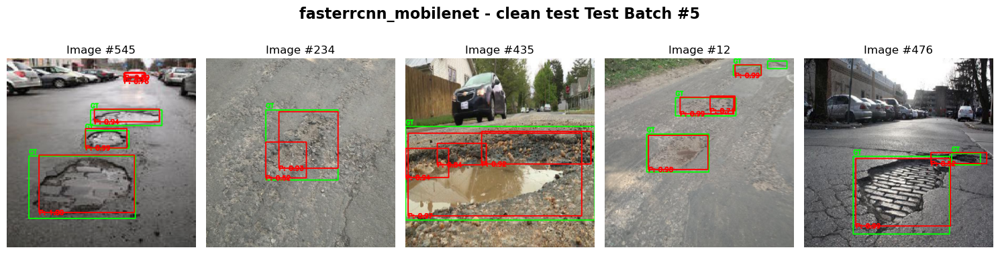

Mean Average Precision @ 0.5 : 0.5032 FPS: 189.21


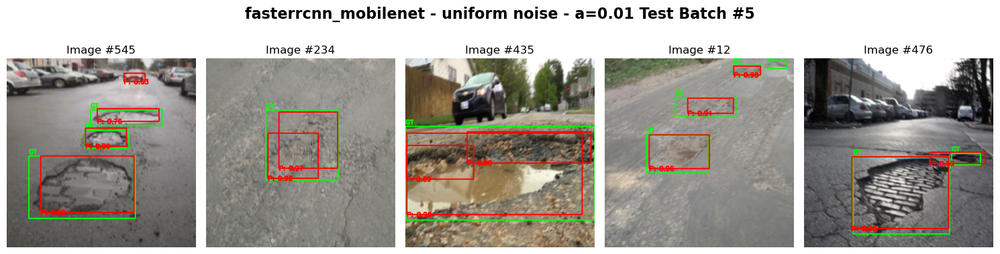

Mean Average Precision @ 0.5 : 0.1989 FPS: 203.50


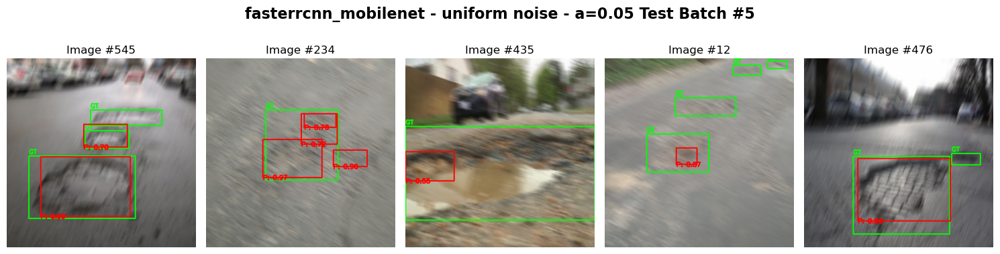

Mean Average Precision @ 0.5 : 0.0794 FPS: 208.34


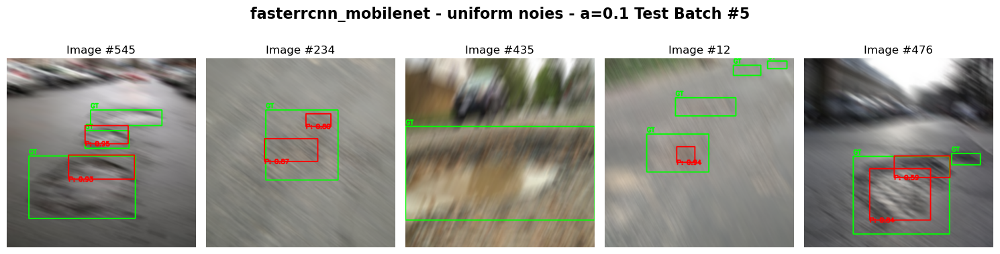

Mean Average Precision @ 0.5 : 0.4844 FPS: 188.47


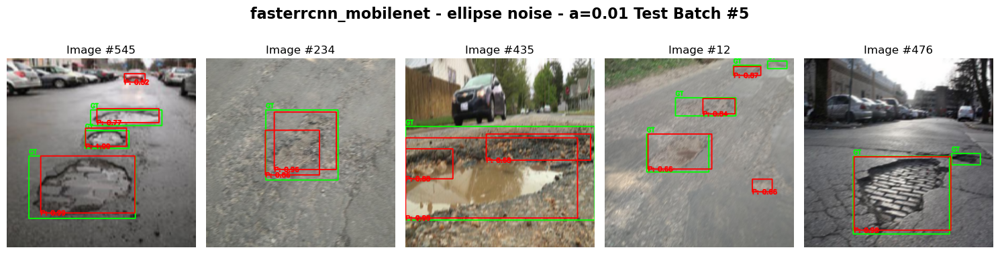

Mean Average Precision @ 0.5 : 0.1710 FPS: 201.88


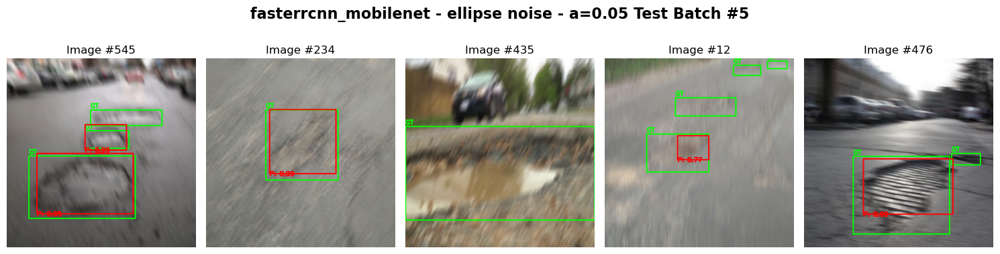

Mean Average Precision @ 0.5 : 0.0478 FPS: 210.84


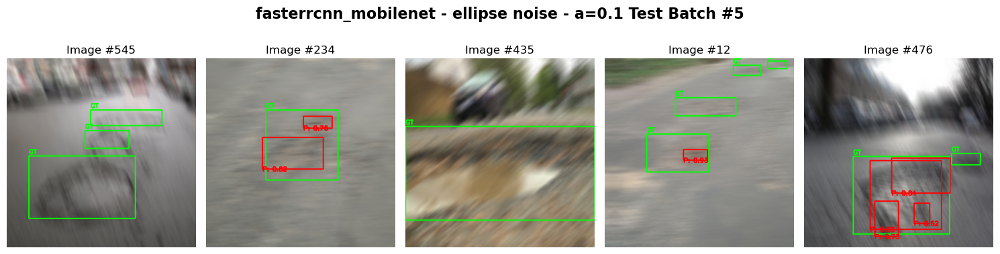

Mean Average Precision @ 0.5 : 0.2999 FPS: 203.47


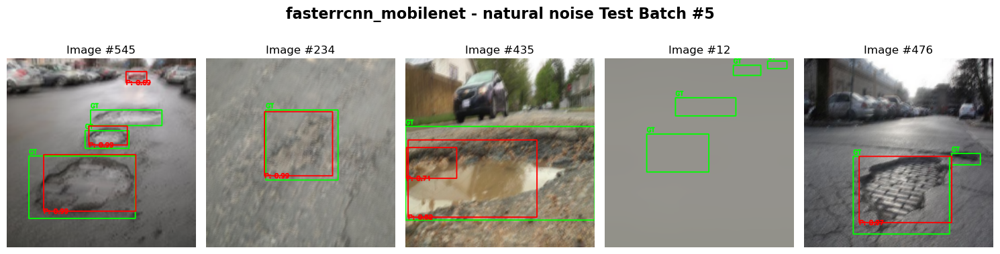

In [10]:
model_name = "fasterrcnn_mobilenet_v3_large_fpn"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("data/models/fasterrcnn_mobilenet_v3_large_fpn/fasterrcnn_mobilenet_v3_large_fpn_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="fasterrcnn_mobilenet - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="fasterrcnn_mobilenet - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="fasterrcnn_mobilenet - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="fasterrcnn_mobilenet - uniform noies - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="fasterrcnn_mobilenet - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="fasterrcnn_mobilenet - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="fasterrcnn_mobilenet - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="fasterrcnn_mobilenet - natural noise")

In [11]:
# save history to .json file
utils.update_json(history, model_name="fasterrcnn_mobilenet")

In [12]:
# Train with data augmentation:
trainer.train_from_config(model_config_path="data/models/fasterrcnn_mobilenet_v3_large_fpn/fasterrcnn_mobilenet_v3_large_fpn_best_params.json", train_set=train_set, val_set=val_set, save_path="./data/models/fasterrcnn_mobilenet_v3_large_fpn", kornia_aug=True)

Starting training for fasterrcnn_mobilenet_v3_large_fpn with the following parameters:
{'batch_size': 6, 'epochs': 17, 'preweight_mode': 'fine_tuning', 'optimizer': 'SGD', 'lr': 0.005562807003835387, 'momentum': 0.9328567236871179, 'weight_decay': 7.349985786517183e-05, 'scheduler': 'ReduceLROnPlateau', 'factor': 0.3997437126341112, 'patience': 4}
Epoch 1/17, Train Loss: 44.3416, Val mAP@50: 0.4482, FPS: 173.55, Epoch Time: 7.73 seconds
Epoch 2/17, Train Loss: 35.1800, Val mAP@50: 0.4856, FPS: 187.32, Epoch Time: 7.55 seconds
Epoch 3/17, Train Loss: 32.2736, Val mAP@50: 0.5443, FPS: 194.42, Epoch Time: 7.43 seconds
Epoch 4/17, Train Loss: 31.1247, Val mAP@50: 0.5473, FPS: 209.40, Epoch Time: 7.32 seconds
Epoch 5/17, Train Loss: 32.4100, Val mAP@50: 0.6004, FPS: 198.68, Epoch Time: 7.45 seconds
Epoch 6/17, Train Loss: 30.9144, Val mAP@50: 0.6171, FPS: 209.49, Epoch Time: 7.35 seconds
Epoch 7/17, Train Loss: 32.3497, Val mAP@50: 0.5662, FPS: 209.75, Epoch Time: 7.23 seconds
Epoch 8/17, T

{'train_losses': [44.34155493974686,
  35.180033415555954,
  32.273636877536774,
  31.12472739815712,
  32.410040244460106,
  30.914384186267853,
  32.34966716170311,
  30.851170271635056,
  30.38029009103775,
  30.47885189950466,
  28.868500530719757,
  31.28290346264839,
  28.525659903883934,
  30.13982990384102,
  28.817247226834297,
  28.699815824627876,
  29.96455693244934],
 'val_maps': [0.448153555393219,
  0.48563897609710693,
  0.5442691445350647,
  0.5472671985626221,
  0.6003804802894592,
  0.6171340942382812,
  0.566152036190033,
  0.6175113916397095,
  0.6358718872070312,
  0.598700225353241,
  0.64968341588974,
  0.6435277462005615,
  0.5910854935646057,
  0.6221274733543396,
  0.6503852009773254,
  0.6570321321487427,
  0.6174553632736206],
 'best_val_map': 0.6570321321487427,
 'fps': 208.209012027452,
 'train_time': 123.45852041244507,
 'model_parameters': 18871333,
 'model_size': 72.39925003051758}

Mean Average Precision @ 0.5 : 0.5642 FPS: 202.39


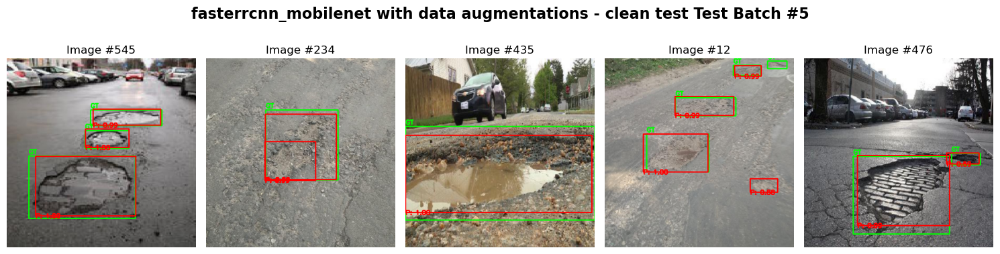

Mean Average Precision @ 0.5 : 0.5665 FPS: 202.59


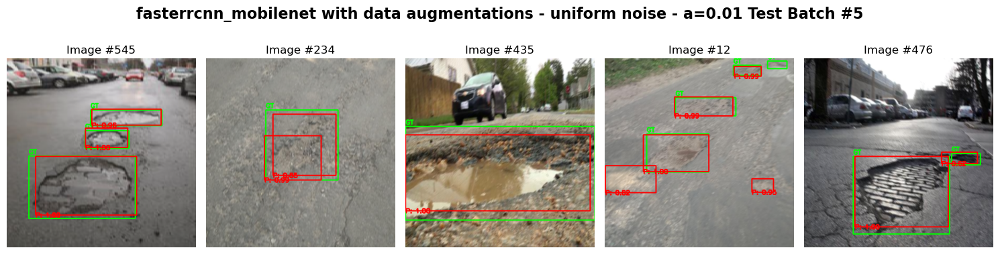

Mean Average Precision @ 0.5 : 0.4533 FPS: 192.83


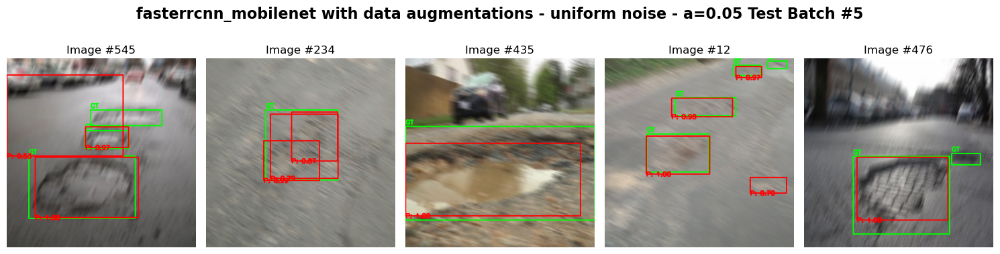

Mean Average Precision @ 0.5 : 0.3619 FPS: 188.96


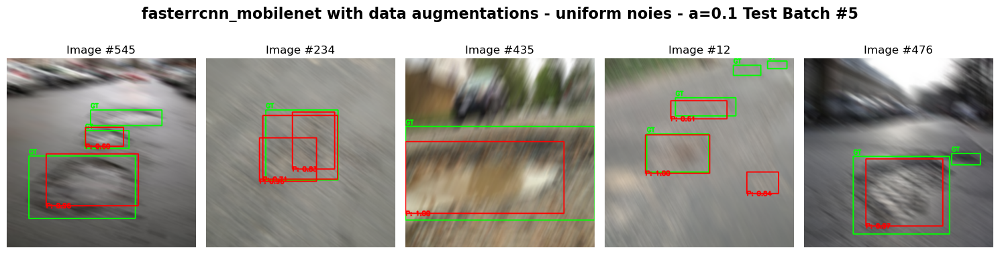

Mean Average Precision @ 0.5 : 0.5708 FPS: 200.42


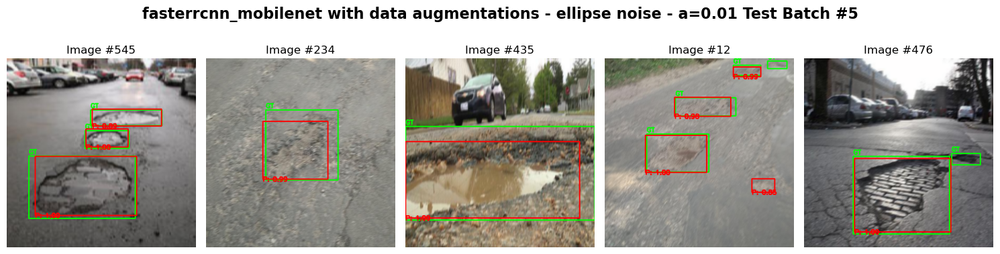

Mean Average Precision @ 0.5 : 0.3991 FPS: 192.73


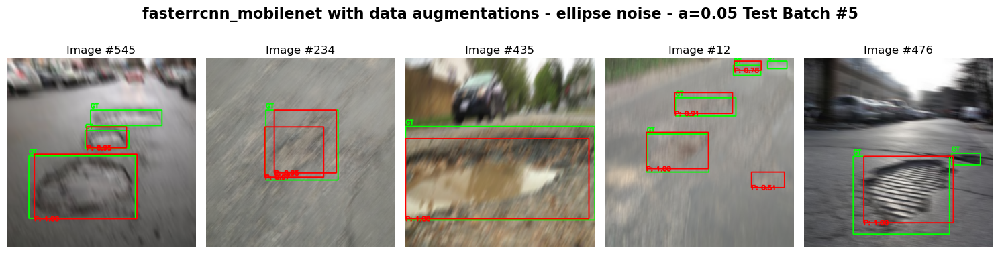

Mean Average Precision @ 0.5 : 0.2768 FPS: 190.60


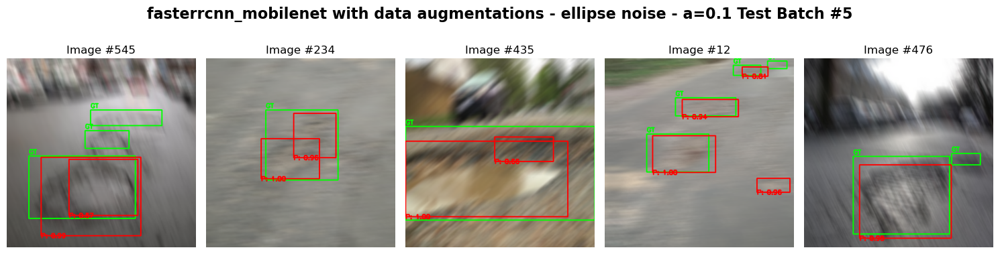

Mean Average Precision @ 0.5 : 0.4723 FPS: 200.15


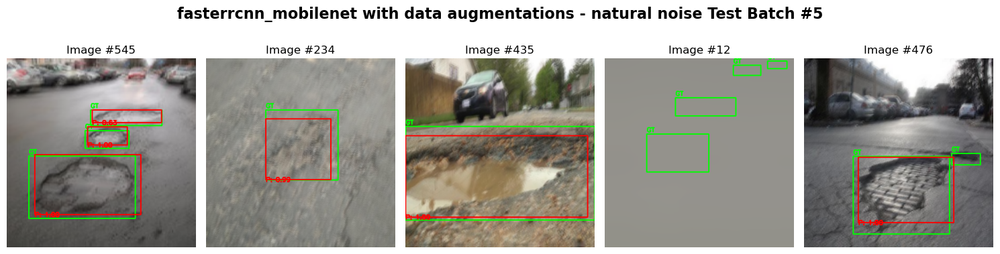

In [13]:
model_name = "fasterrcnn_mobilenet_v3_large_fpn"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("data/models/fasterrcnn_mobilenet_v3_large_fpn/fasterrcnn_mobilenet_v3_large_fpn_aug_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="fasterrcnn_mobilenet with data augmentations - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="fasterrcnn_mobilenet with data augmentations - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="fasterrcnn_mobilenet with data augmentations - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="fasterrcnn_mobilenet with data augmentations - uniform noies - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="fasterrcnn_mobilenet with data augmentations - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="fasterrcnn_mobilenet with data augmentations - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="fasterrcnn_mobilenet with data augmentations - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="fasterrcnn_mobilenet with data augmentations - natural noise")

In [14]:
# save history to .json file
utils.update_json(history, model_name="fasterrcnn_mobilenet_aug")